# Imports

In [37]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T
import yaml
import os
import glob
import torch
import matplotlib.pyplot as plt


# Setup YOLO v11

In [1]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 932.6/932.6 kB 17.2 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 75.4MB/s]


# Exploratory Data Analysis

In [5]:
def load_class_names(yaml_path):
    """Load class names from a YAML file and return a dictionary mapping indices to names."""
    with open(yaml_path, 'r') as file:
        data = yaml.safe_load(file)
    class_names = data['names']
    return {index: name for index, name in enumerate(class_names)}

In [6]:
def get_data(root, data_type, class_dict):
    """Retrieve image paths, bounding boxes, and class counts for a given data type."""
    im_paths = glob.glob(f"{root}/data/{data_type}/images/*")
    all_bboxes = []
    all_analysis_datas = {}
    for im_path in im_paths:
        bboxes = []
        im_ext = os.path.splitext(im_path)[-1]
        lbl_path = im_path.replace(im_ext, ".txt").replace(f"{data_type}/images", f"{data_type}/labels")
        if not os.path.isfile(lbl_path):
            continue
        with open(lbl_path, 'r') as file:
            meta_data = file.readlines()
        for data in meta_data:
            parts = data.strip().split()[:5]
            cls_name = class_dict[int(parts[0])]
            bboxes.append([cls_name] + [float(x) for x in parts[1:]])
            all_analysis_datas[cls_name] = all_analysis_datas.get(cls_name, 0) + 1
        all_bboxes.append(bboxes)
    return im_paths, all_bboxes, all_analysis_datas

In [17]:
root = "/kaggle/input/smoke-fire-detection-yolo"
data_types = ["train", "val", "test"]
yaml_path = f"{root}/data.yaml"
n_ims = 6
rows = 2

# Load class names
class_dict = load_class_names(yaml_path)

attributes = {}
# Process each data type
for data_type in data_types:
    print(f"\nProcessing {data_type.upper()} data...")
    
    # Get data
    im_paths, all_bboxes, analysis_datas = get_data(root, data_type, class_dict)

    attributes[data_type] = im_paths, all_bboxes, analysis_datas


Processing TRAIN data...

Processing VAL data...

Processing TEST data...


In [18]:
attributes

{'train': (['/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB09284.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB02703.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB02722.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/AoF02394.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB02906.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB06500.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB00681.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/AoF01289.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB05935.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/WEB03746.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/AoF04775.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/AoF05094.jpg',
   '/kaggle/input/smoke-fire-detection-yolo/data/train/images/AoF05

In [7]:
def plot_images(im_paths, all_bboxes, n_ims, rows):
    """Display a grid of images with bounding boxes."""
    cols = n_ims // rows
    plt.figure(figsize=(25, 20))
    indices = random.sample(range(len(im_paths)), n_ims)
    count = 1
    for idx in indices:
        if count > n_ims:
            break
        im_path = im_paths[idx]
        bboxes = all_bboxes[idx]
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape
        for bbox in bboxes:
            class_id, x_center, y_center, w, h = bbox
            x_min = int((x_center - w / 2) * width)
            y_min = int((y_center - h / 2) * height)
            x_max = int((x_center + w / 2) * width)
            y_max = int((y_center + h / 2) * height)
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(or_im, (x_min, y_min), (x_max, y_max), color, 3)
        plt.subplot(rows, cols, count)
        plt.imshow(or_im)
        plt.axis("off")
        plt.title(f"There are {len(bboxes)} object(s) in the image.")
        count += 1
    plt.show()




Plotting images for : train


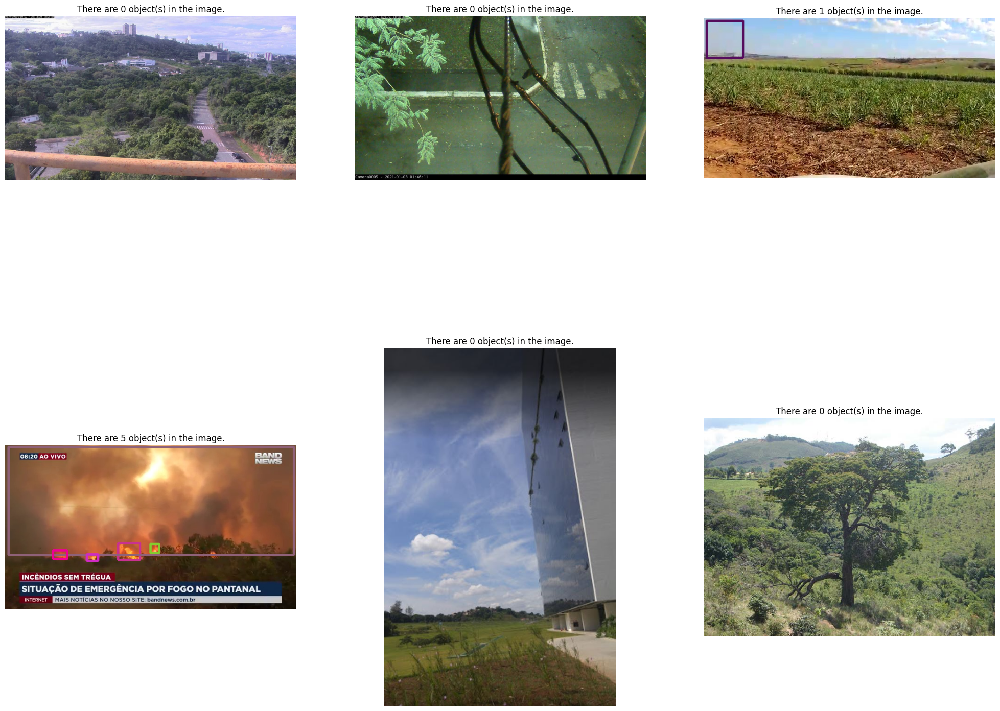




Plotting images for : val


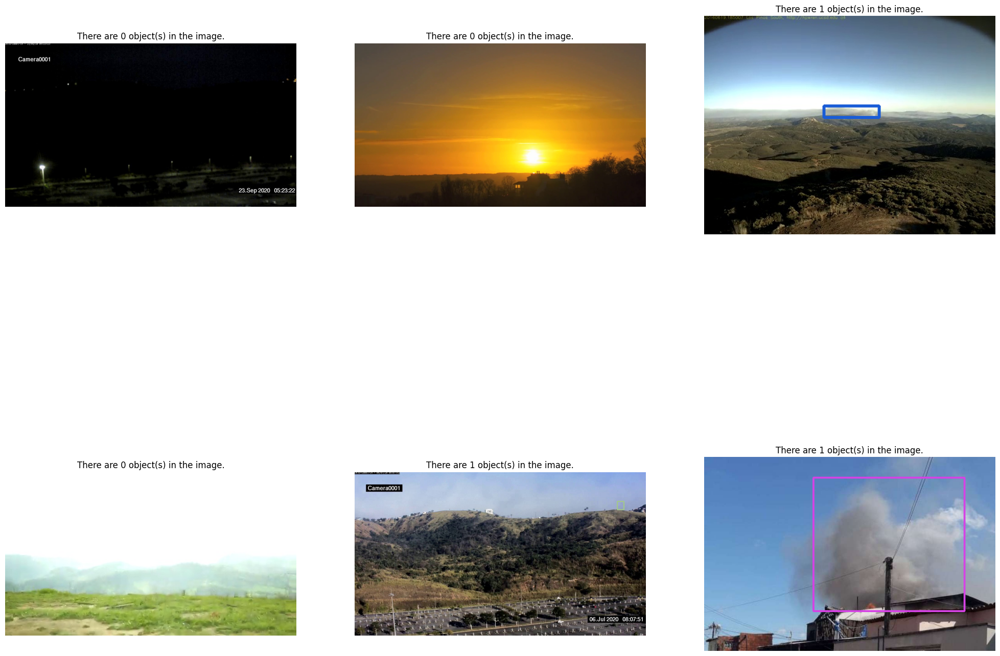




Plotting images for : test


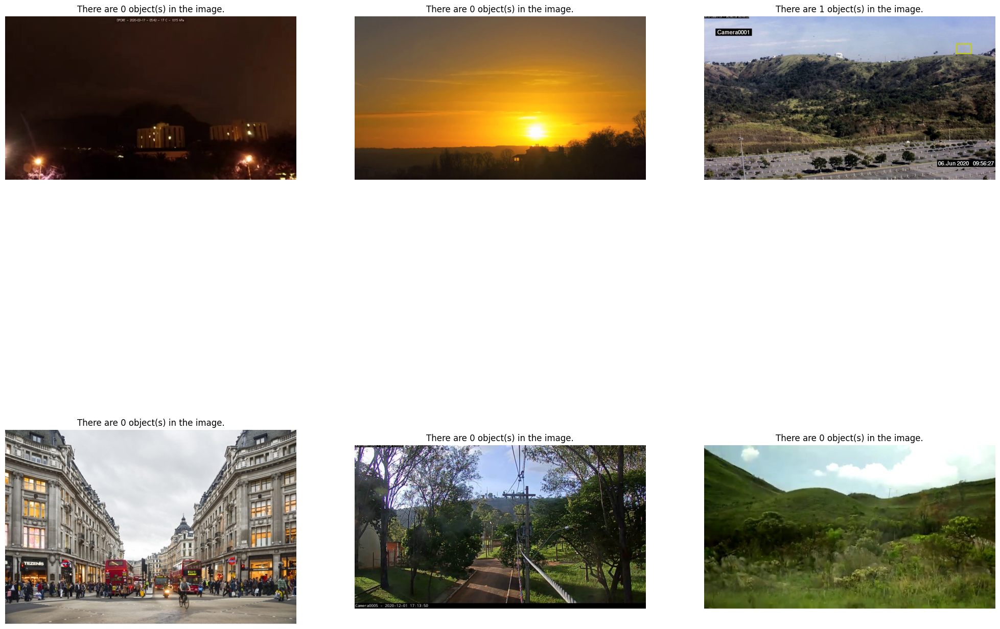

In [25]:
for data_type, vals in attributes.items():
    print("\n\n")
    print("Plotting images for :", data_type)
    im_paths, all_bboxes, analysis_datas = vals
    plot_images(im_paths, all_bboxes, n_ims, rows)

In [8]:
def plot_class_counts(analysis_datas, data_type, color="blue"):
    """Plot a bar chart of class counts to analyze imbalance."""
    cls_names = list(analysis_datas.keys())
    counts = list(analysis_datas.values())
    plt.figure(figsize=(15, 6))
    indices = np.arange(len(counts))
    plt.bar(indices, counts, color=color)
    plt.xlabel("Class Names")
    plt.ylabel("Object Counts")
    plt.title(f"{data_type.upper()} Dataset Class Imbalance")
    plt.xticks(indices, cls_names)
    for i, v in enumerate(counts):
        plt.text(i, v + 0.5, str(v), ha='center')
    plt.show()

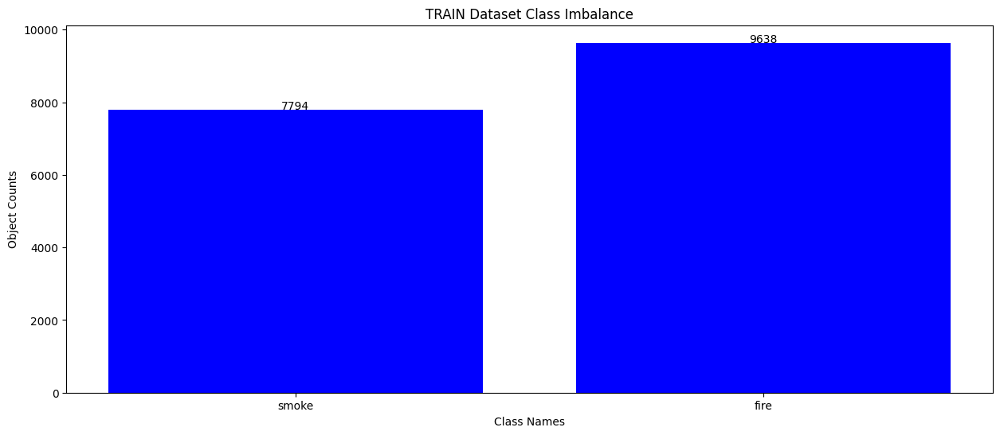

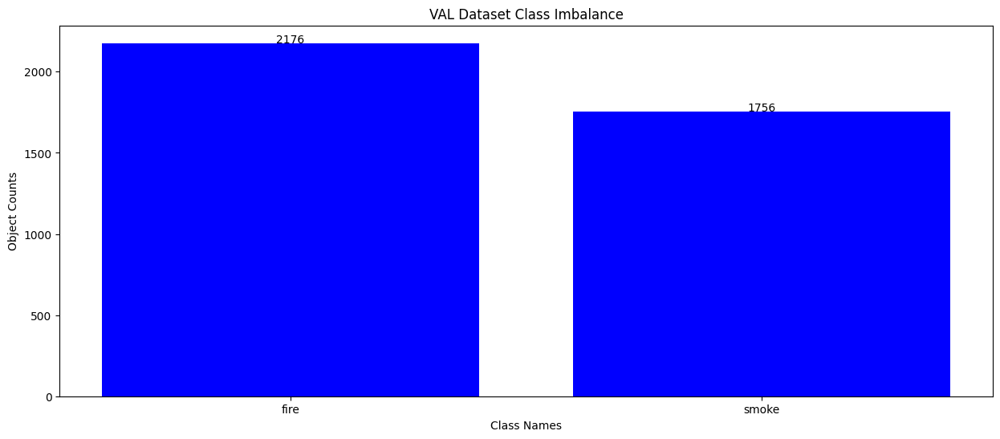

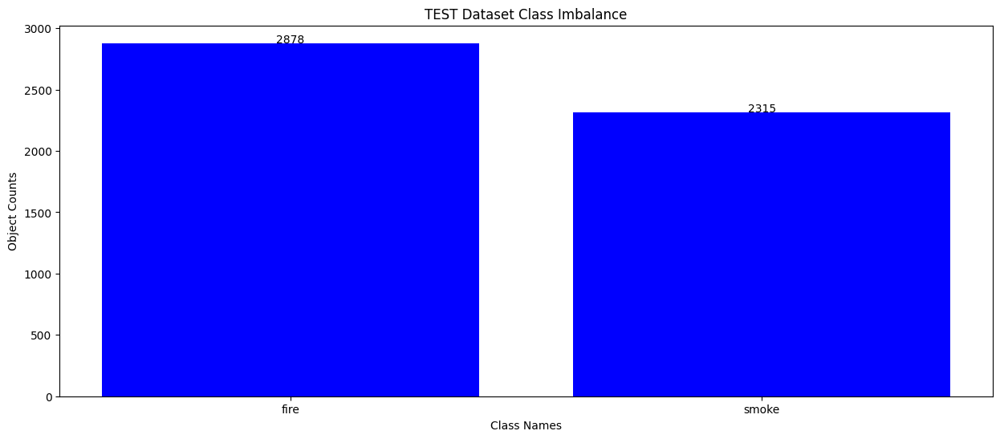

In [30]:
for data_type, vals in attributes.items():
    im_paths, all_bboxes, analysis_datas = vals
    plot_class_counts(analysis_datas, data_type, color="blue")

In [9]:
def get_objects_per_image(all_bboxes):
    """Return the number of objects per image."""
    return [len(bboxes) for bboxes in all_bboxes]

def plot_objects_per_image(objects_per_image, data_type):
    """Plot a histogram of the number of objects per image."""
    max_objects = max(objects_per_image) if objects_per_image else 0
    bins = np.arange(0, max_objects + 2) - 0.5
    plt.figure(figsize=(8, 6))
    plt.hist(objects_per_image, bins=bins, rwidth=0.8, color='skyblue')
    plt.xlabel("Number of Objects")
    plt.ylabel("Number of Images")
    plt.title(f"{data_type.upper()} - Objects per Image Distribution")
    plt.show()

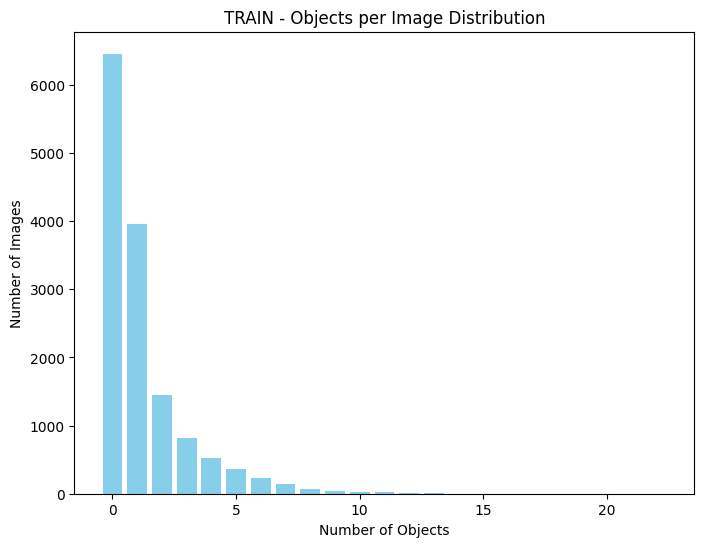

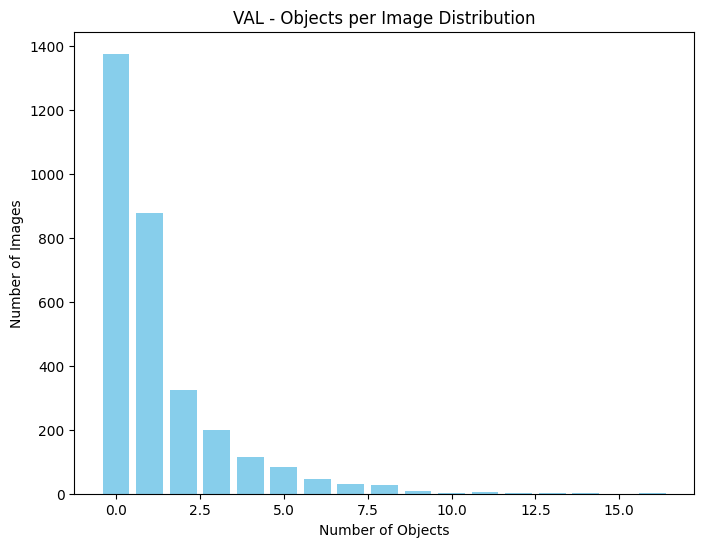

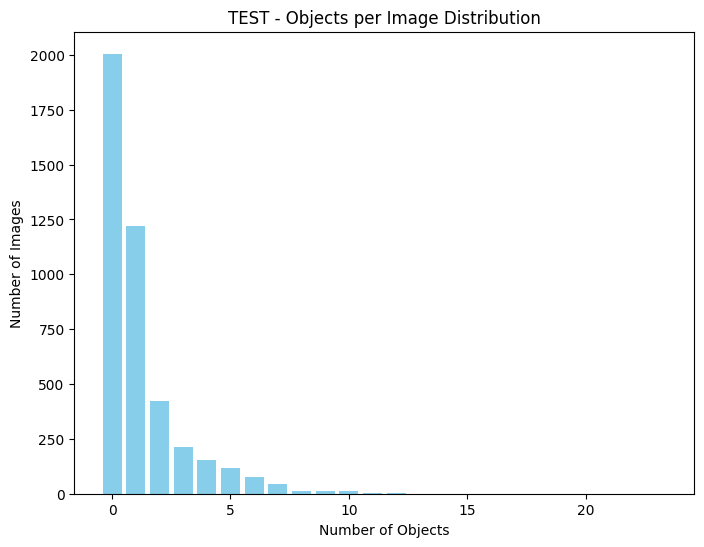

In [29]:
for data_type, vals in attributes.items():
    print("\n\n")
    im_paths, all_bboxes, analysis_datas = vals
    objects_per_image = get_objects_per_image(all_bboxes)
    plot_objects_per_image(objects_per_image, data_type)

In [10]:
def get_bbox_sizes(all_bboxes):
    """Extract normalized widths and heights of all bounding boxes."""
    widths = []
    heights = []
    for bboxes in all_bboxes:
        for bbox in bboxes:
            _, _, _, w, h = bbox
            widths.append(w)
            heights.append(h)
    return widths, heights

def plot_bbox_sizes(widths, heights, data_type):
    """Plot histograms of bounding box widths and heights."""
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(widths, bins=20, color='blue', alpha=0.7)
    plt.xlabel("Width (normalized)")
    plt.ylabel("Frequency")
    plt.title(f"{data_type.upper()} - Bounding Box Widths")
    plt.subplot(1, 2, 2)
    plt.hist(heights, bins=20, color='green', alpha=0.7)
    plt.xlabel("Height (normalized)")
    plt.ylabel("Frequency")
    plt.title(f"{data_type.upper()} - Bounding Box Heights")
    plt.tight_layout()
    plt.show()

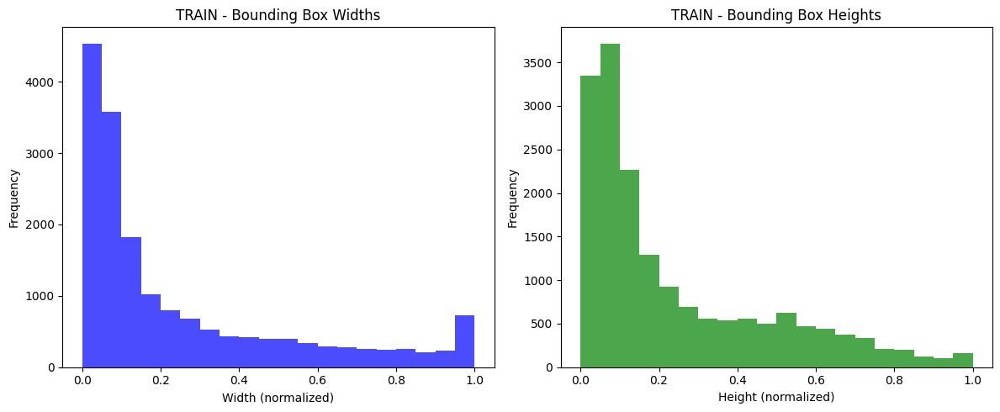

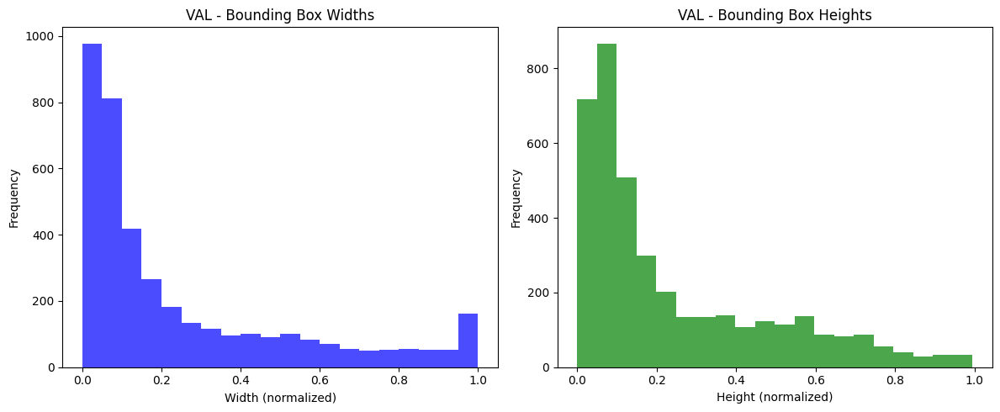

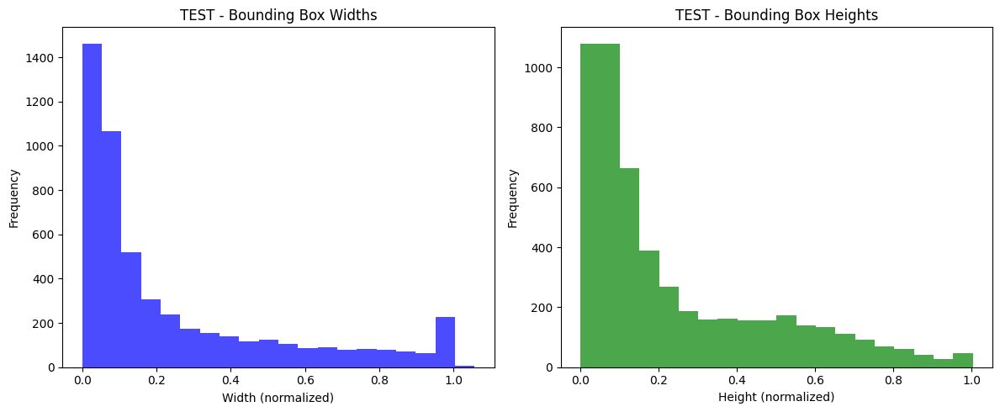

In [31]:
for data_type, vals in attributes.items():
    im_paths, all_bboxes, analysis_datas = vals
    widths, heights = get_bbox_sizes(all_bboxes)
    plot_bbox_sizes(widths, heights, data_type)

In [11]:
def get_bbox_centers(all_bboxes):
    """Extract normalized center coordinates of all bounding boxes."""
    centers = []
    for bboxes in all_bboxes:
        for bbox in bboxes:
            _, x_center, y_center, _, _ = bbox
            centers.append((x_center, y_center))
    return centers

def plot_bbox_centers(centers, data_type):
    """Plot a 2D histogram of bounding box centers."""
    x = [c[0] for c in centers]
    y = [c[1] for c in centers]
    plt.figure(figsize=(8, 6))
    plt.hist2d(x, y, bins=20, cmap='Blues')
    plt.colorbar(label='Frequency')
    plt.xlabel("x_center (normalized)")
    plt.ylabel("y_center (normalized)")
    plt.title(f"{data_type.upper()} - Heatmap of Bounding Box Centers")
    plt.show()

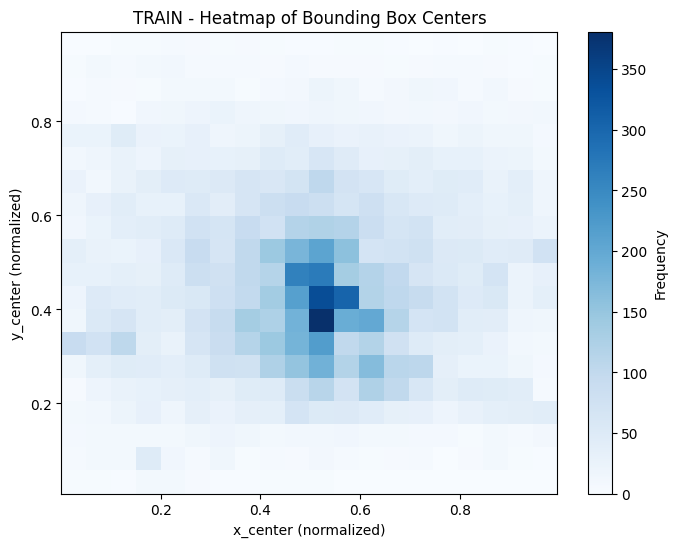

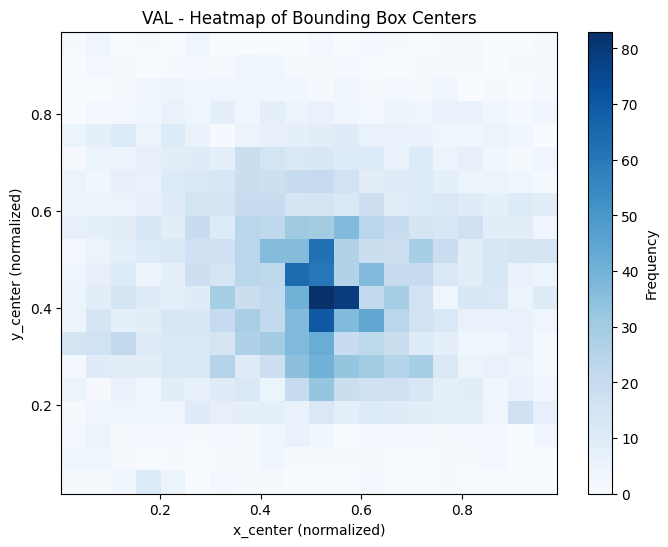

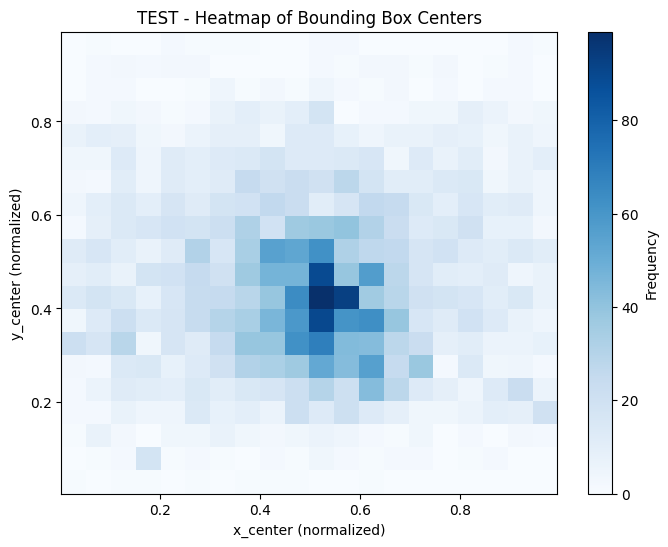

In [32]:
for data_type, vals in attributes.items():
    im_paths, all_bboxes, analysis_datas = vals
    centers = get_bbox_centers(all_bboxes)
    plot_bbox_centers(centers, data_type)

In [12]:
def get_images_per_class(all_bboxes, class_dict):
    """Count images containing each class."""
    class_names = list(class_dict.values())
    images_per_class = {cls: 0 for cls in class_names}
    for bboxes in all_bboxes:
        classes_in_image = set(bbox[0] for bbox in bboxes)
        for cls in classes_in_image:
            images_per_class[cls] += 1
    return images_per_class

def plot_images_per_class(images_per_class, data_type):
    """Plot a bar chart of images per class."""
    cls_names = list(images_per_class.keys())
    counts = list(images_per_class.values())
    plt.figure(figsize=(10, 6))
    plt.bar(cls_names, counts, color='purple')
    plt.xlabel("Class Names")
    plt.ylabel("Number of Images")
    plt.title(f"{data_type.upper()} - Images Containing Each Class")
    plt.show()

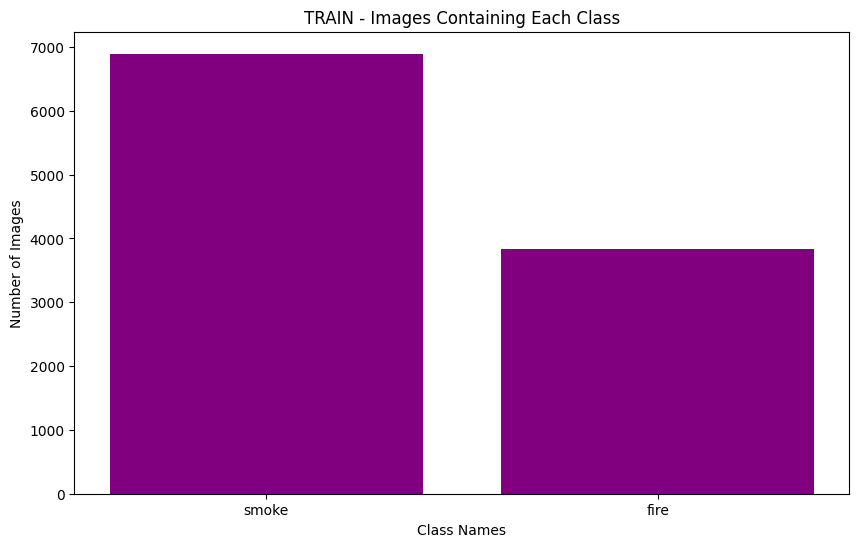

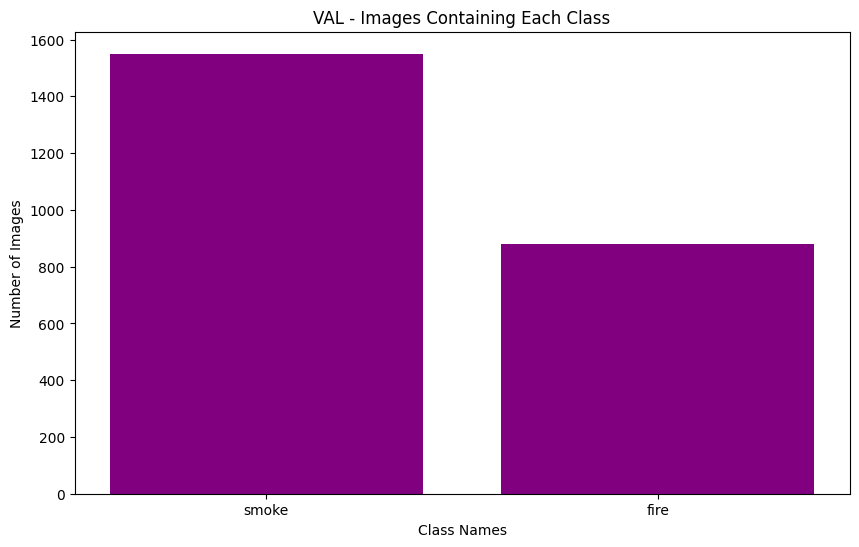

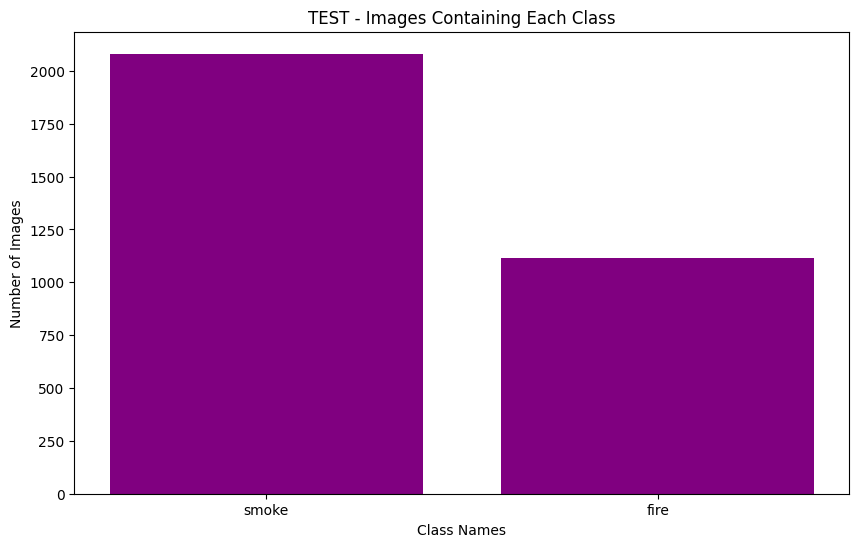

In [33]:
for data_type, vals in attributes.items():
    im_paths, all_bboxes, analysis_datas = vals
    images_per_class = get_images_per_class(all_bboxes, class_dict)
    plot_images_per_class(images_per_class, data_type)

In [34]:
# Load and update YAML content
yml_file_path = f"{root}/data.yaml"

if not os.path.exists(yml_file_path):
    raise FileNotFoundError(f"YAML file not found at {yml_file_path}")

with open(yml_file_path, 'r') as file:
    data = yaml.safe_load(file)

# Check for required keys
required_keys = ['train', 'val', 'test']
for key in required_keys:
    if key not in data:
        raise KeyError(f"Missing key '{key}' in YAML file")

# Update paths with absolute paths and verify existence
data['train'] = os.path.abspath(f'{root}/data/train')
data['val']   = os.path.abspath(f'{root}/data/val')
data['test']  = os.path.abspath(f'{root}/data/test')

for key in required_keys:
    if not os.path.exists(data[key]):
        raise FileNotFoundError(f"Directory for '{key}' does not exist: {data[key]}")

print(data)

# Save updated YAML content
output_path = '/kaggle/working/updated_config.yml'
with open(output_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

{'path': '/kaggle/working/D Fire Dataset', 'train': '/kaggle/input/smoke-fire-detection-yolo/data/train', 'val': '/kaggle/input/smoke-fire-detection-yolo/data/val', 'test': '/kaggle/input/smoke-fire-detection-yolo/data/test', 'names': ['smoke', 'fire'], 'nc': 2, 'train_count': 14122, 'val_count': 3099, 'test_count': 4306}


In [38]:
num_gpus = torch.cuda.device_count()
devices = list(range(num_gpus)) if num_gpus > 0 else 'cpu'
devices

[0, 1]

In [40]:
train_results = model.train(
    data=output_path,
    epochs=10,
    imgsz=640,
    device=devices,
    verbose=True 
)

Ultralytics 8.3.89 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
                                                       CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/updated_config.yml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=[0, 1], workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, 

# Learning Curves

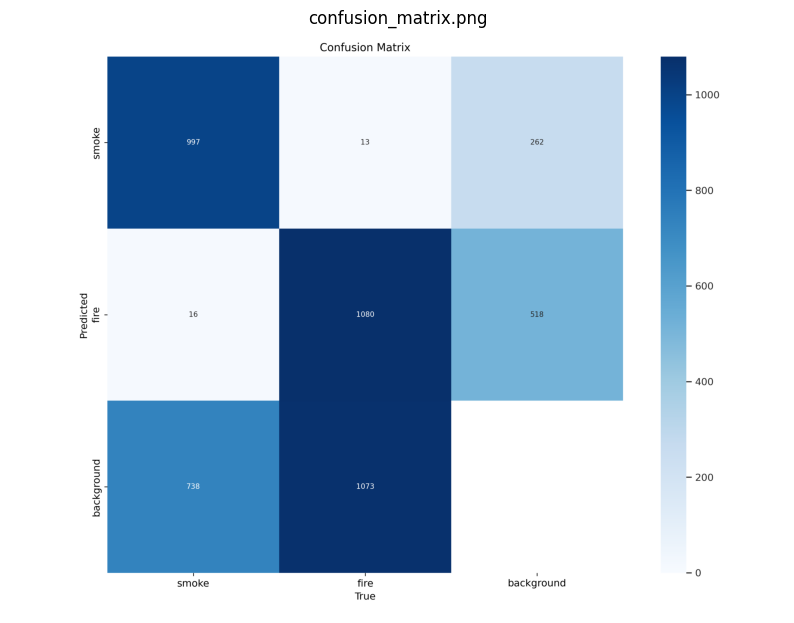

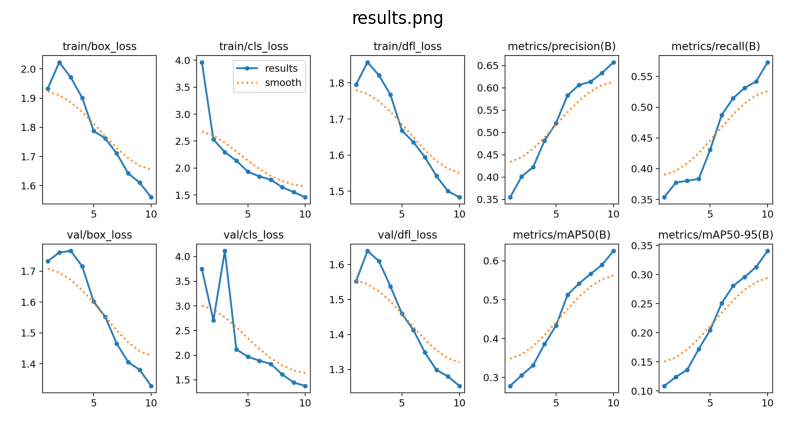

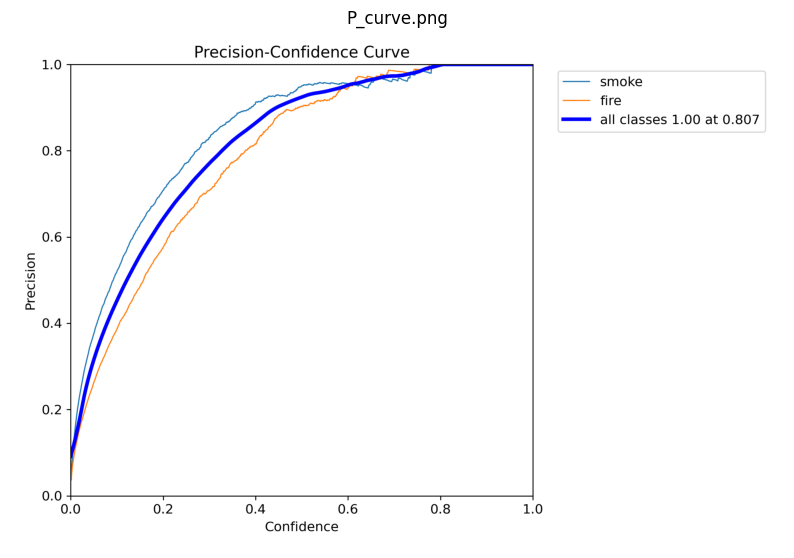

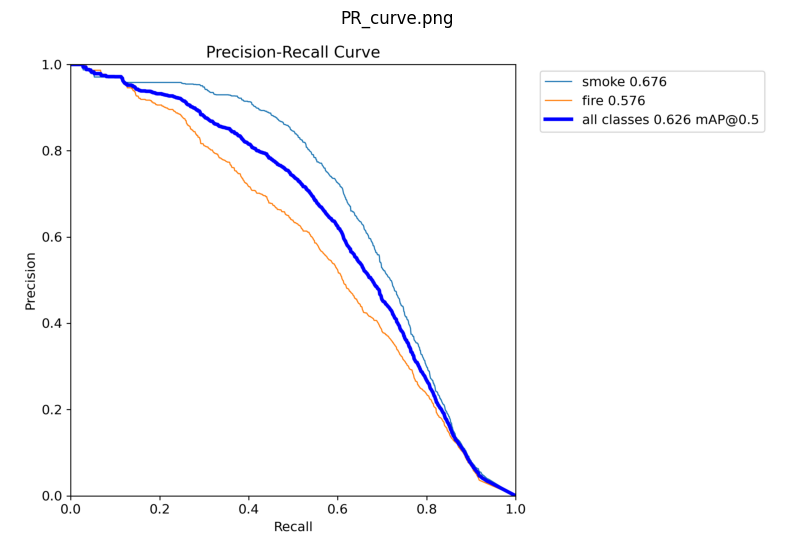

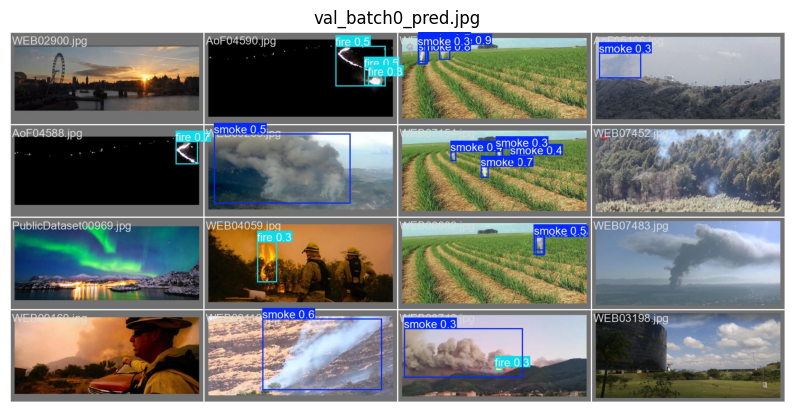

In [41]:
# Visualize training results
run_dirs = sorted(glob.glob('runs/detect/train*'), key=os.path.getmtime)
latest_run = run_dirs[-1] if run_dirs else None

if latest_run:
    image_files = [
        f"{latest_run}/confusion_matrix.png",
        f"{latest_run}/results.png",
        f"{latest_run}/P_curve.png",
        f"{latest_run}/PR_curve.png",
        f"{latest_run}/val_batch0_pred.jpg"
    ]
    
    for img_path in image_files:
        if os.path.exists(img_path):
            img = Image.open(img_path)
            plt.figure(figsize=(10, 10))
            plt.imshow(img)
            plt.axis('off')
            plt.title(os.path.basename(img_path))
            plt.show()
        else:
            print(f"Image not found: {img_path}")
else:
    print("No training run found.")

In [46]:
# Inference on test images
test_images_path = f"{root}/data/test/images"
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
inference_results = model(test_images_path, device=device, verbose=True)





WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/4306 /kaggle/input/smoke-fire-detection-yolo/data/test/images/AoF06723.jpg: 384x640 (no detections), 11.9ms
image 2/4306 /kaggle/input/smoke-fire-detection-yolo/data/test/images/AoF06724.jpg: 352x640 (no detections), 11.4ms
image 3/4306 /kaggle/input/smoke-fire-detection-yolo/data/test/images/AoF06725.jpg: 384x640 (no detections), 11.8ms
image 4/4306 /kaggle/input/smoke-fire-detection-yolo/data/test/images/AoF06726.jpg: 384x640 (no detections),

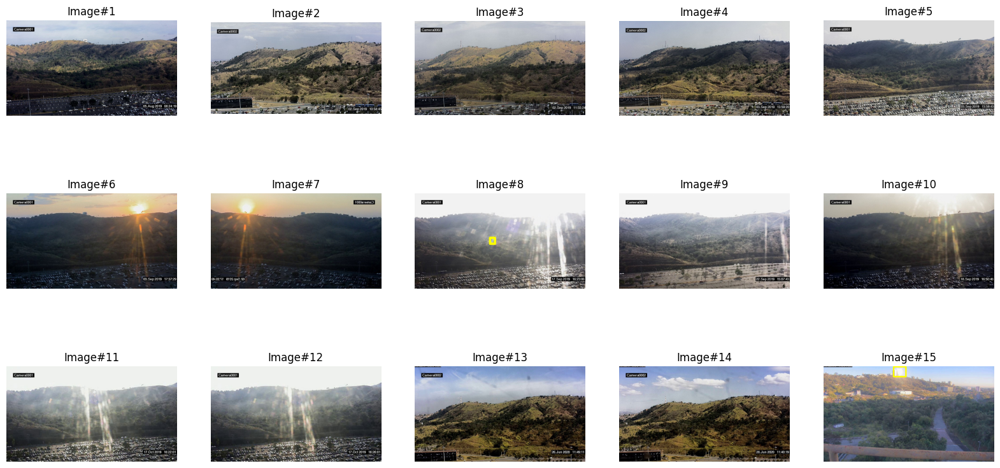

In [45]:
def inference_vis(res, n_ims, rows):
    cols = n_ims // rows
    plt.figure(figsize = (20, 10))
    for idx, r in enumerate(res):
        if idx == n_ims: break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        if idx == n_ims: break    
        for i in r:
            for bbox in i.boxes:
                box = bbox.xyxy[0]
                x1, y1, x2, y2 = box
                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,255,0), thickness=10)
        plt.imshow(or_im_rgb)
        plt.title(f"Image#{idx + 1}")
        plt.axis("off")
inference_vis(res = inference_results, n_ims = 15, rows = 3)